# Library

In [1]:
import os
import glob
import cv2
import torch
import sklearn
import warnings
import matplotlib
import imagehash
import itertools    

import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
import matplotlib.pyplot as plt

from PIL import Image
from tqdm import tqdm_notebook as tqdm

from tensorflow import keras
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.applications.xception import Xception
from tensorflow.keras.applications.xception import preprocess_input
from tensorflow.keras.applications.xception import decode_predictions
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from sklearn.model_selection import train_test_split

warnings.filterwarnings("ignore")

sns.set_context('notebook')
sns.set_style('whitegrid')
sns.set_palette('Spectral')

In [2]:
print(f'Numpy version : {np.__version__}')
print(f'Tensorflow version : {tf.__version__}')
print(f'Pandas version : {pd.__version__}')
print(f'Imagehash version : {imagehash.__version__}')

print(f'Matplotlib version : {matplotlib.__version__}')
print(f'Scikit-Learn version : {sklearn.__version__}')
print(f'Torch version : {torch.__version__}')

Numpy version : 1.21.6
Tensorflow version : 2.6.4
Pandas version : 1.3.5
Imagehash version : 4.2.1
Matplotlib version : 3.5.3
Scikit-Learn version : 1.0.2
Torch version : 1.11.0


# Configuration

In [3]:
seed = 42
img_dir = '/kaggle/input/kitchenware-classification/images'
target_size = (150,150)
input_shape = (150,150,3)
batch_size = 32

# Read Data

In [4]:
full_train = pd.read_csv('/kaggle/input/kitchenware-classification/train.csv')
test = pd.read_csv('/kaggle/input/kitchenware-classification/test.csv')
sample = pd.read_csv('/kaggle/input/kitchenware-classification/sample_submission.csv')\

full_train['image'] = full_train['Id'].map(lambda x: f'{img_dir}/{x:0>4}.jpg')
test['image'] = test['Id'].map(lambda x: f'{img_dir}/{x:0>4}.jpg')

full_train['fixed_Id'] = full_train['Id'].map(lambda x: f'{x:0>4}')
test['fixed_Id'] = test['Id'].map(lambda x: f'{x:0>4}')

In [5]:
full_train.shape, test.shape

((5559, 4), (3808, 3))

In [6]:
full_train.head()

,Id,label,image,fixed_Id
0,560,glass,/kaggle/input/kitchenware-classification/image...,0560
1,4675,cup,/kaggle/input/kitchenware-classification/image...,4675
2,875,glass,/kaggle/input/kitchenware-classification/image...,0875
3,4436,spoon,/kaggle/input/kitchenware-classification/image...,4436
4,8265,plate,/kaggle/input/kitchenware-classification/image...,8265


In [7]:
test.head()

,Id,image,fixed_Id
0,678,/kaggle/input/kitchenware-classification/image...,0678
1,3962,/kaggle/input/kitchenware-classification/image...,3962
2,9271,/kaggle/input/kitchenware-classification/image...,9271
3,5133,/kaggle/input/kitchenware-classification/image...,5133
4,8842,/kaggle/input/kitchenware-classification/image...,8842


In [8]:
full_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5559 entries, 0 to 5558
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Id        5559 non-null   int64 
 1   label     5559 non-null   object
 2   image     5559 non-null   object
 3   fixed_Id  5559 non-null   object
dtypes: int64(1), object(3)
memory usage: 173.8+ KB


In [9]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3808 entries, 0 to 3807
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Id        3808 non-null   int64 
 1   image     3808 non-null   object
 2   fixed_Id  3808 non-null   object
dtypes: int64(1), object(2)
memory usage: 89.4+ KB


# TPU or GPU Detection

In [15]:
if tf.test.gpu_device_name(): 
    print('Default GPU Device:{}'.format(tf.test.gpu_device_name()))

else:
    print("Please install GPU version of TF")

Default GPU Device:/device:GPU:0


2023-01-17 14:48:00.259335: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-01-17 14:48:00.327376: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-17 14:48:00.328742: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-17 14:48:00.329511: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA 

In [11]:
!ls -lha /kaggle/input/

total 8.0K
drwxr-xr-x 3 root   root    4.0K Jan 17 14:43 .
drwxr-xr-x 5 root   root    4.0K Jan 17 14:43 ..
drwxr-xr-x 3 nobody nogroup    0 Jan 15 12:08 kitchenware-classification


# EDA

## Check the Class Distributions

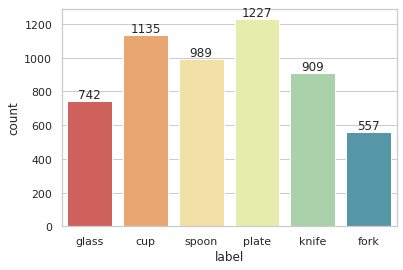

In [12]:
ax = sns.countplot(x='label', data=full_train)
for container in ax.containers:
    ax.bar_label(container)

plt.show()

### Conclusion
- Plate & Cup are the most images inside the trainset
- Fork and Glass are the least images inside the trainset

## Check Duplicate Images
Calculate similarities between all image pairs.

I use imagehash library to calculate hash value of image. https://github.com/JohannesBuchner/imagehash

There are several hash functions provided and I used 4 of them and combined the calculated hash values.
- average hashing (aHash)
- perception hashing (pHash)
- difference hashing (dHash)
- wavelet hashing (wHash)


In [13]:
def run():

    funcs = [
        imagehash.average_hash,
        imagehash.phash,
        imagehash.dhash,
        imagehash.whash
    ]

    kitids = []
    hashes = []
    for path in tqdm(glob.glob('/kaggle/input/kitchenware-classification/images/*.jpg')):

        image = Image.open(path)
        imageid = path.split('/')[-1].split('.')[0]

        kitids.append(imageid)
        hashes.append(np.array([f(image).hash for f in funcs]).reshape(256))

    return kitids, np.array(hashes)

%time kitids, hashes_all = run()

  0%|          | 0/9367 [00:00<?, ?it/s]

CPU times: user 7min 27s, sys: 3.57 s, total: 7min 30s
Wall time: 9min 3s


In [14]:
# Convert numpy array into torch tensor to speed up similarity calculation.
hashes_all = torch.Tensor(hashes_all.astype(int)).cuda()

# Calculate similarities among all image pairs. Divide the value by 256 to normalize (0-1).
%time sims = np.array([(hashes_all[i] == hashes_all).sum(dim=1).cpu().numpy()/256 for i in range(hashes_all.shape[0])])

# Thresholding
indices1 = np.where(sims > 0.9)
indices2 = np.where(indices1[0] != indices1[1])
kitids1 = [kitids[i] for i in indices1[0][indices2]]
kitids2 = [kitids[i] for i in indices1[1][indices2]]
dups = {tuple(sorted([kitid1,kitid2])):True for kitid1, kitid2 in zip(kitids1, kitids2)}
print('found %d duplicates' % len(dups))

CPU times: user 2.08 s, sys: 614 ms, total: 2.7 s
Wall time: 2.72 s
found 120 duplicates


In [15]:
df = pd.concat([full_train,test], sort=False)
df.Id = df.Id.astype(int)
detail = {kitid:df[df.fixed_Id == kitid].iloc[0] for kitid in itertools.chain.from_iterable(list(dups))}

In [16]:
def show(row1, row2):

    print('Kitchenware ID: %s / %s' % (row1.fixed_Id, row2.fixed_Id))
    print('Label: %s / %s' % (row1.label, row2.label))
    
    image1_dir = df.loc[df.fixed_Id == row1.fixed_Id, 'image'].values[0]
    image2_dir = df.loc[df.fixed_Id == row2.fixed_Id, 'image'].values[0]

    image1 = cv2.imread(image1_dir)
    image2 = cv2.imread(image2_dir)
    
    image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
    image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)
    
    fig = plt.figure(figsize=(10, 20))
    fig.add_subplot(1,2,1)
    plt.imshow(image1)
    fig.add_subplot(1,2, 2)
    plt.imshow(image2)
    plt.show()

Kitchenware ID: 0134 / 0653
Label: nan / spoon


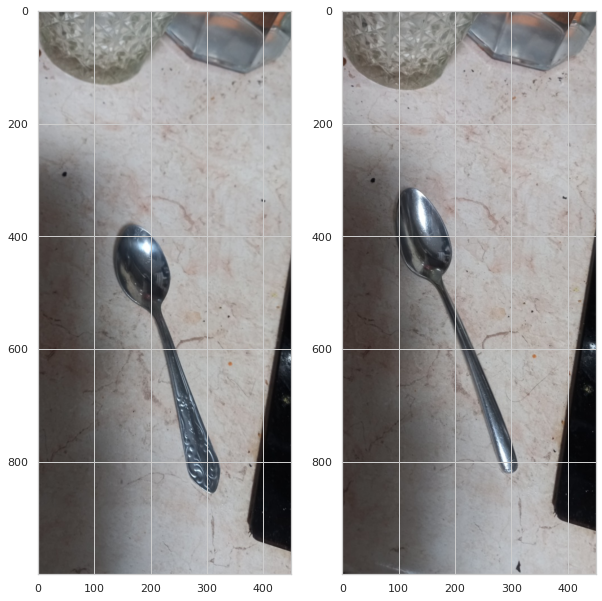

Kitchenware ID: 0237 / 4234
Label: knife / fork


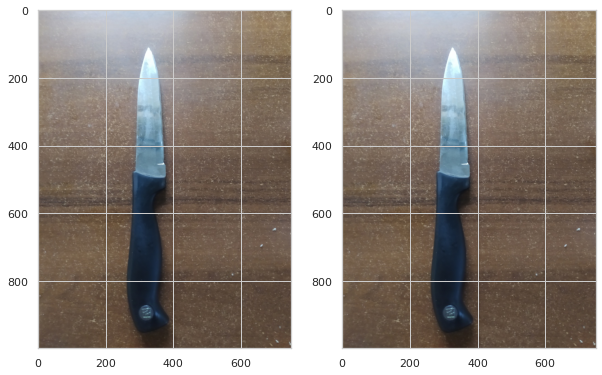

Kitchenware ID: 0286 / 8590
Label: nan / fork


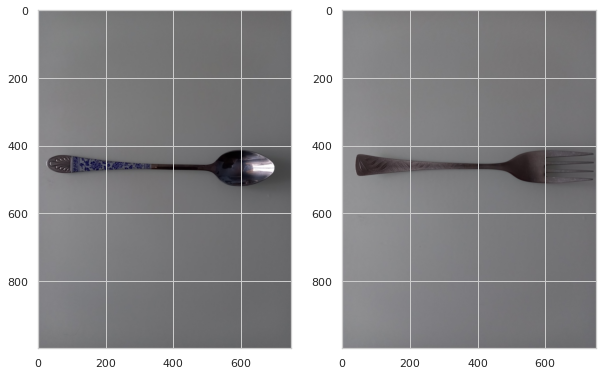

Kitchenware ID: 0402 / 0595
Label: nan / knife


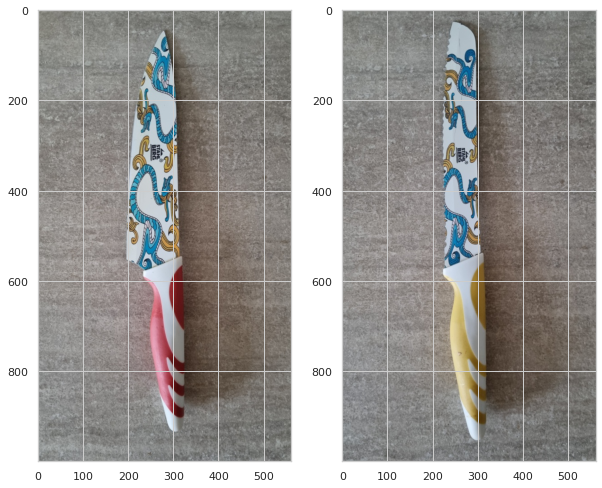

Kitchenware ID: 0410 / 3801
Label: nan / knife


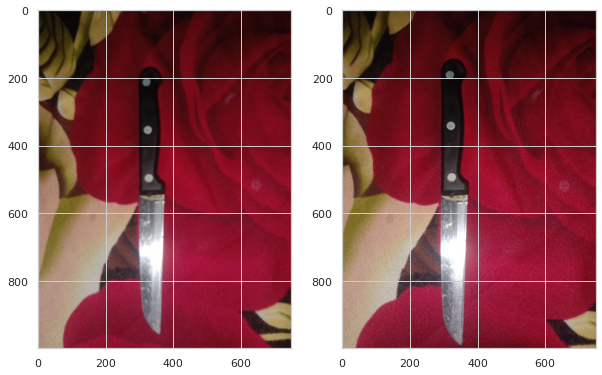

Kitchenware ID: 0412 / 3996
Label: fork / nan


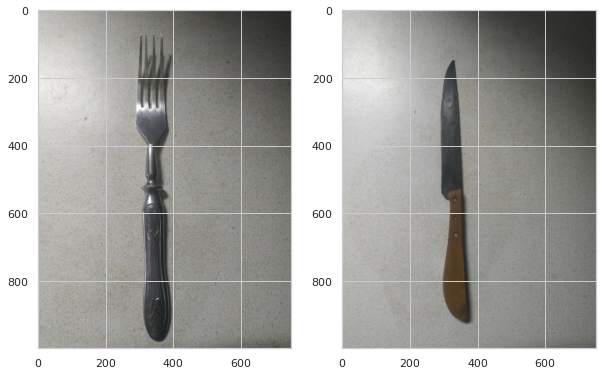

Kitchenware ID: 0937 / 6982
Label: nan / spoon


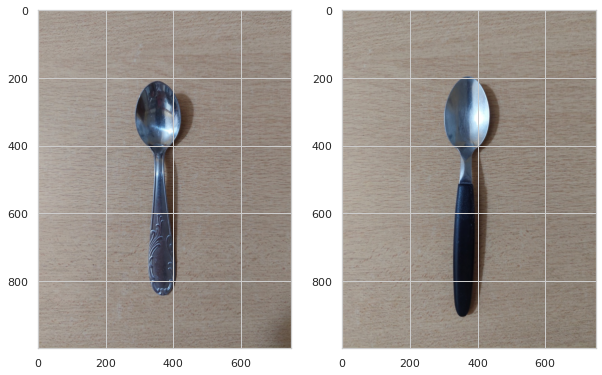

Kitchenware ID: 1135 / 8157
Label: fork / nan


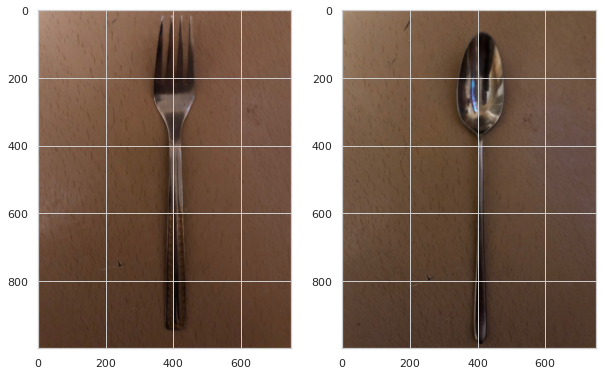

Kitchenware ID: 1165 / 3438
Label: nan / spoon


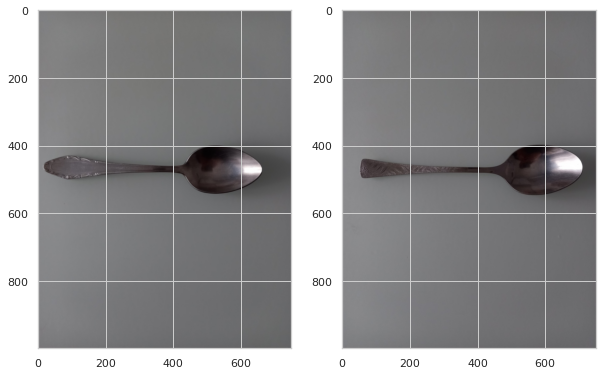

Kitchenware ID: 1348 / 8536
Label: spoon / nan


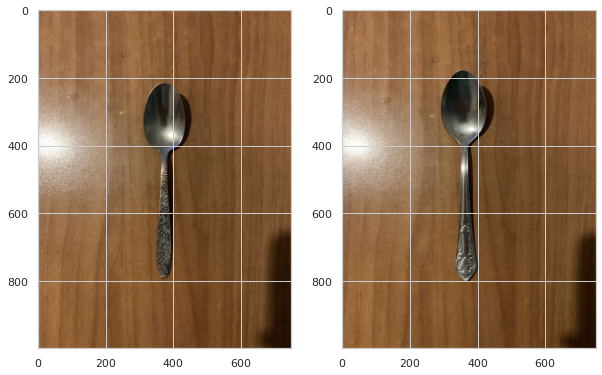

Kitchenware ID: 1508 / 6798
Label: plate / nan


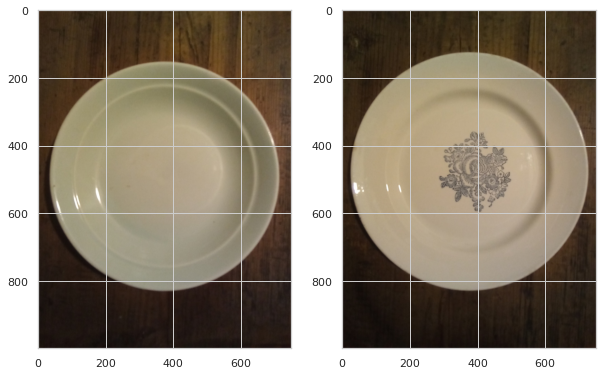

Kitchenware ID: 1591 / 9140
Label: spoon / fork


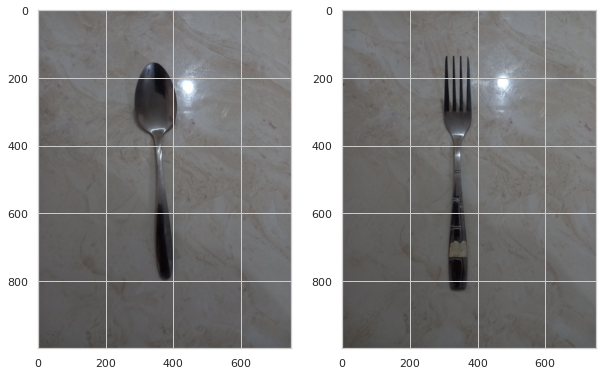

Kitchenware ID: 2068 / 6642
Label: fork / nan


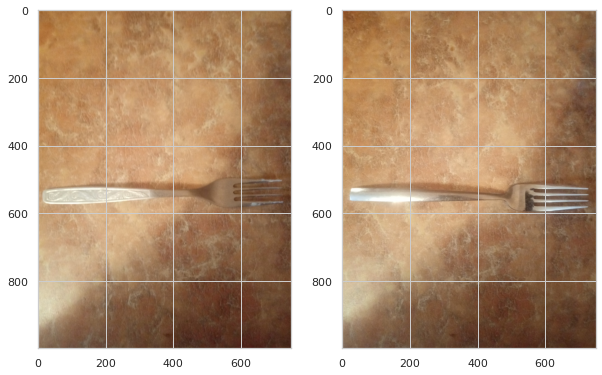

Kitchenware ID: 2085 / 7162
Label: knife / fork


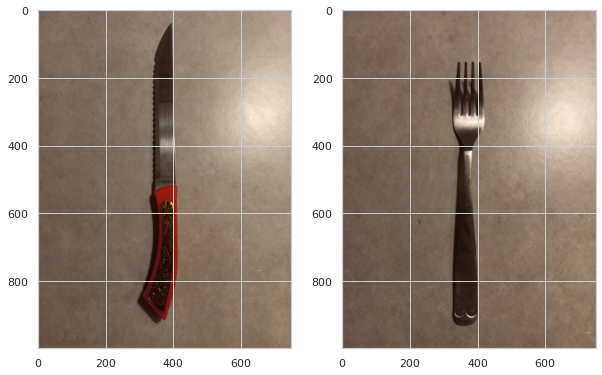

Kitchenware ID: 2085 / 8468
Label: knife / spoon


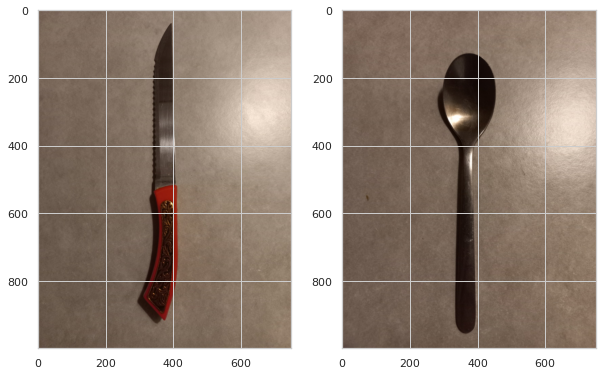

Kitchenware ID: 2168 / 8464
Label: fork / nan


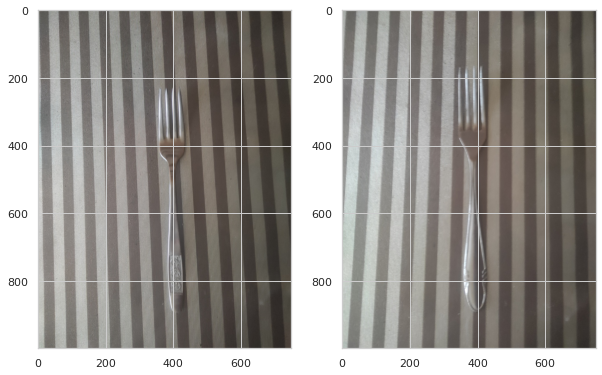

Kitchenware ID: 2277 / 4024
Label: nan / spoon


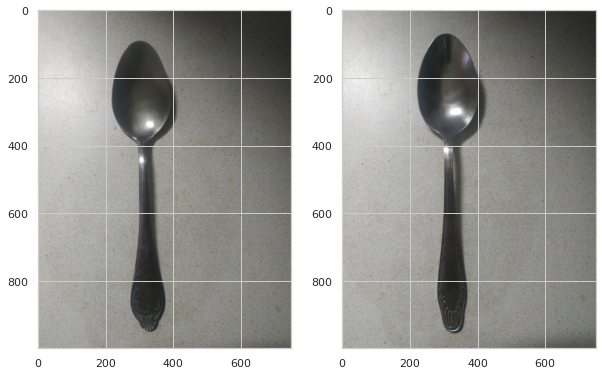

Kitchenware ID: 2334 / 9266
Label: knife / nan


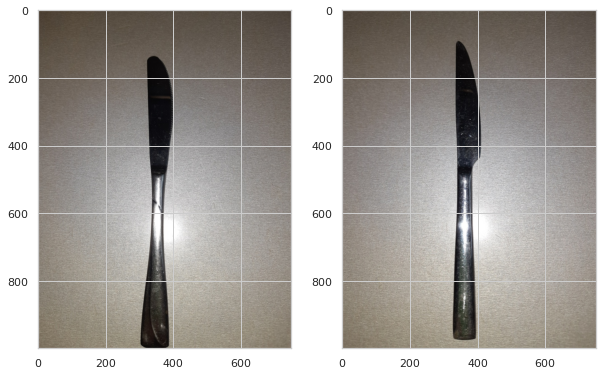

Kitchenware ID: 2422 / 5541
Label: cup / nan


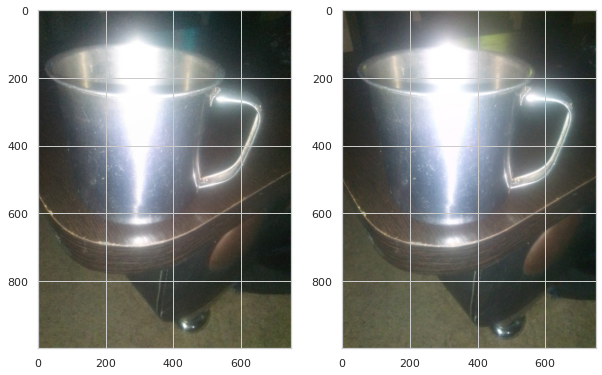

Kitchenware ID: 2434 / 6887
Label: cup / nan


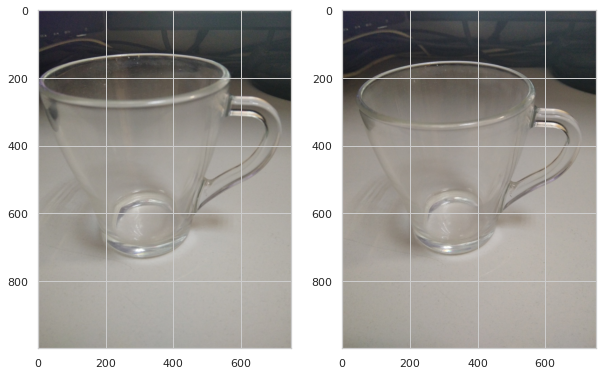

Kitchenware ID: 2459 / 2925
Label: plate / nan


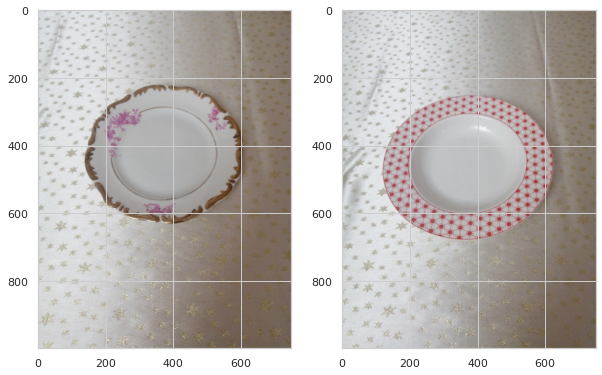

Kitchenware ID: 2532 / 6982
Label: nan / spoon


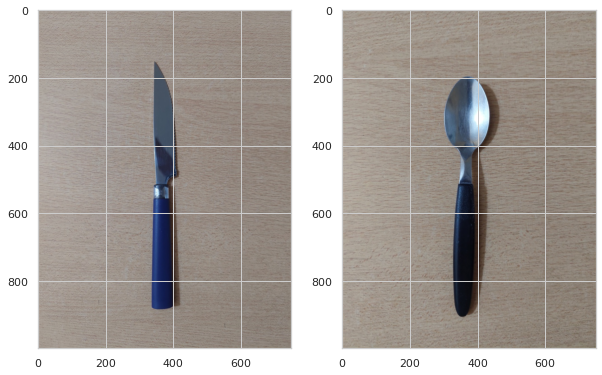

Kitchenware ID: 2631 / 8053
Label: spoon / nan


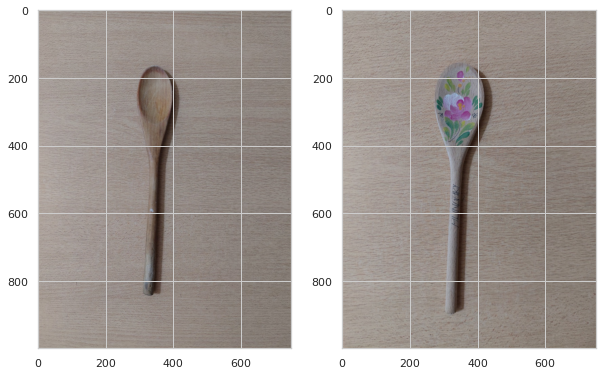

Kitchenware ID: 2925 / 4023
Label: nan / plate


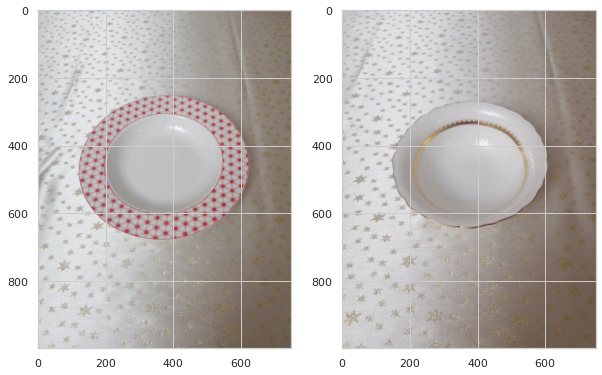

Kitchenware ID: 2925 / 4781
Label: nan / plate


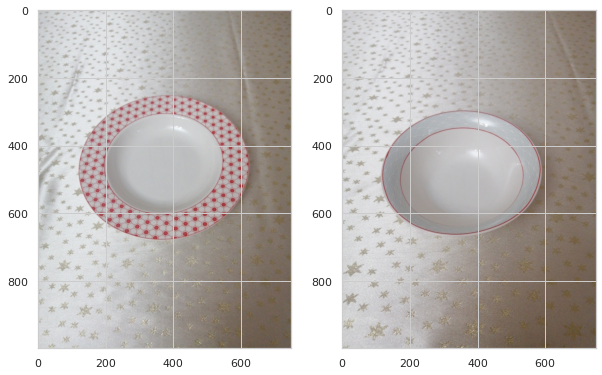

Kitchenware ID: 2974 / 8053
Label: knife / nan


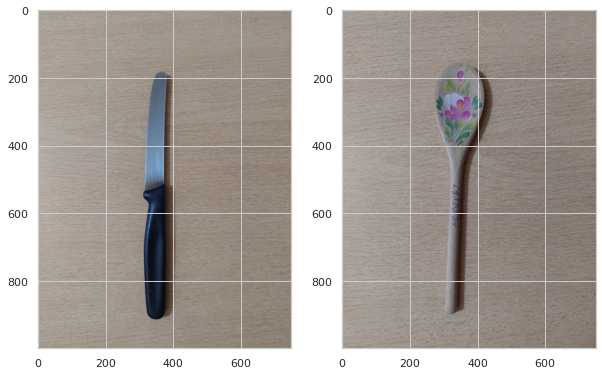

Kitchenware ID: 3179 / 4678
Label: nan / plate


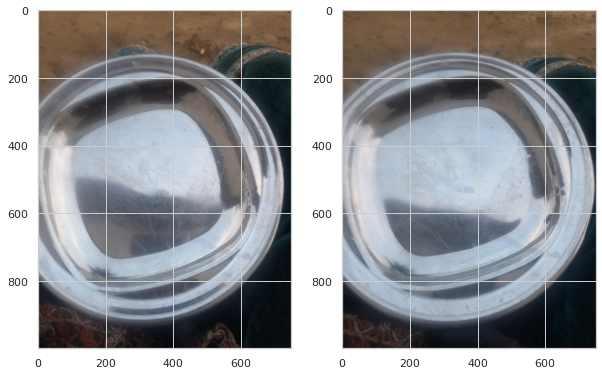

Kitchenware ID: 3428 / 4743
Label: spoon / nan


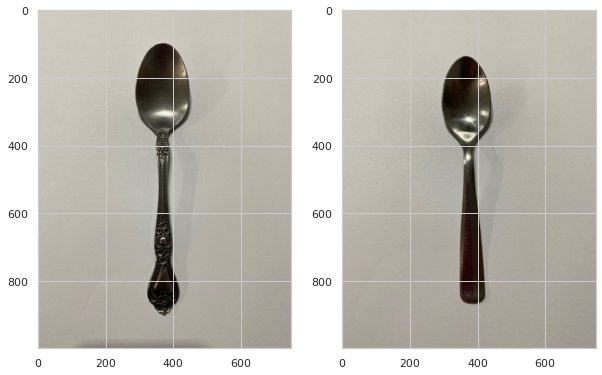

Kitchenware ID: 3428 / 7315
Label: spoon / nan


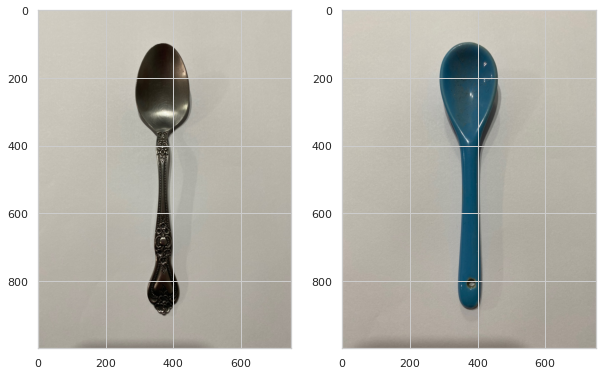

Kitchenware ID: 3428 / 7323
Label: spoon / fork


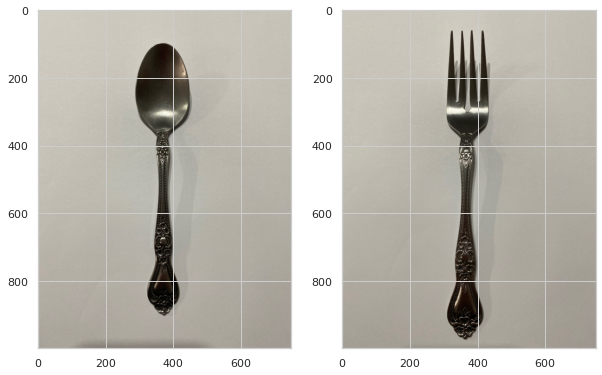

Kitchenware ID: 3579 / 3626
Label: nan / knife


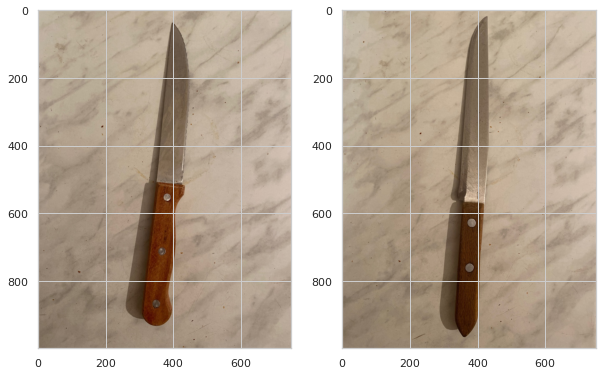

Kitchenware ID: 3708 / 7752
Label: nan / knife


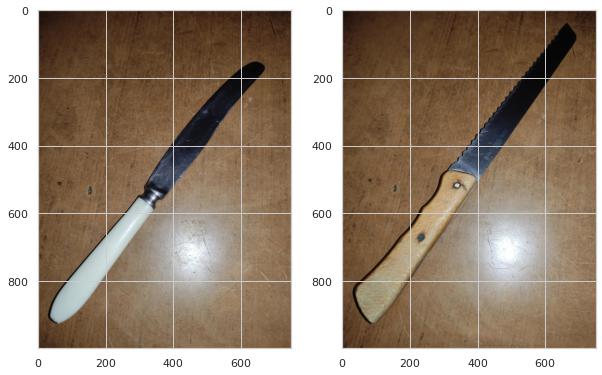

Kitchenware ID: 3738 / 3884
Label: plate / nan


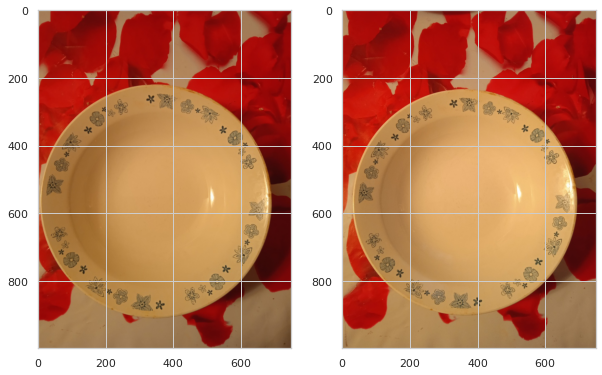

Kitchenware ID: 3757 / 4631
Label: nan / spoon


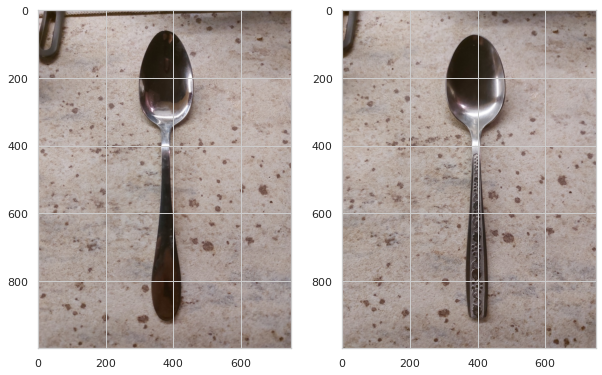

Kitchenware ID: 3808 / 8940
Label: knife / fork


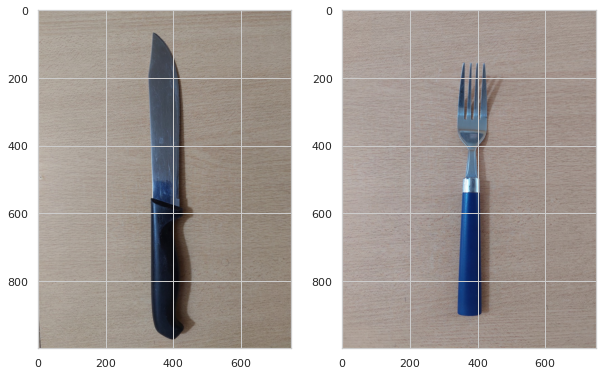

Kitchenware ID: 3822 / 8706
Label: nan / glass


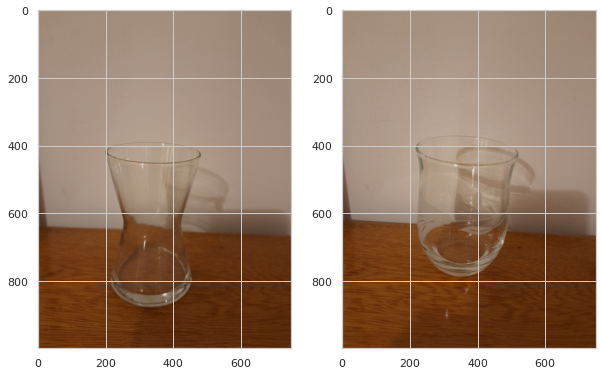

Kitchenware ID: 3973 / 4558
Label: glass / nan


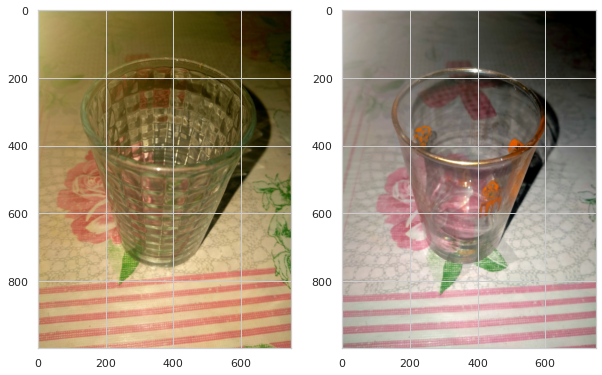

Kitchenware ID: 4056 / 5842
Label: nan / spoon


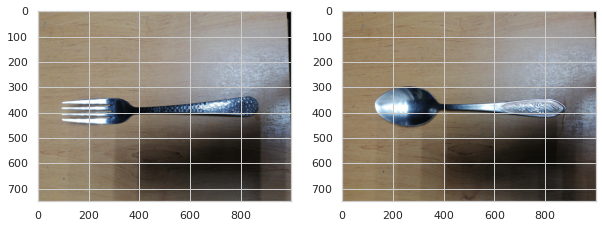

Kitchenware ID: 4489 / 8940
Label: nan / fork


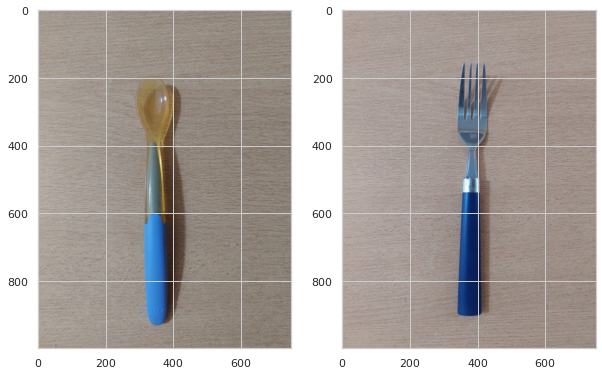

Kitchenware ID: 4519 / 8310
Label: fork / nan


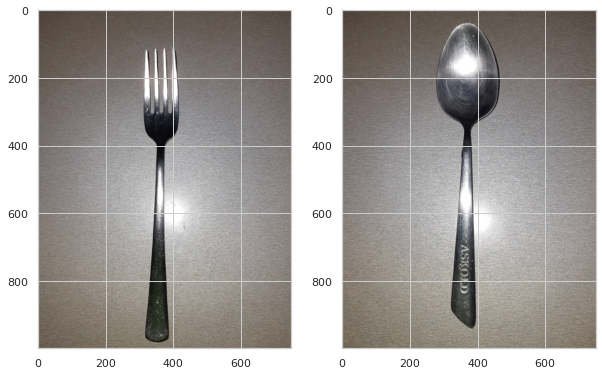

Kitchenware ID: 4955 / 6546
Label: nan / knife


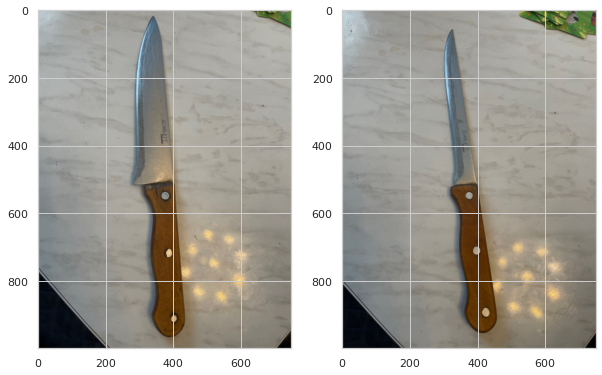

Kitchenware ID: 5185 / 6879
Label: plate / nan


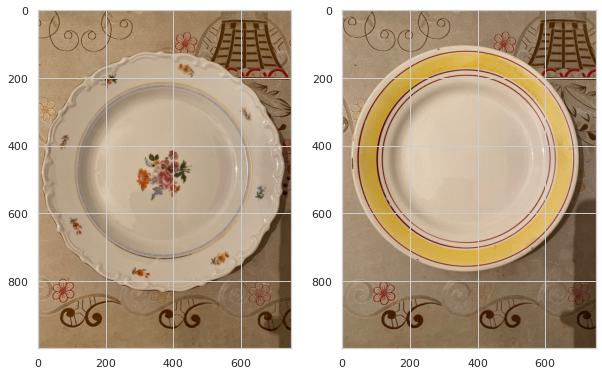

Kitchenware ID: 5908 / 7820
Label: cup / nan


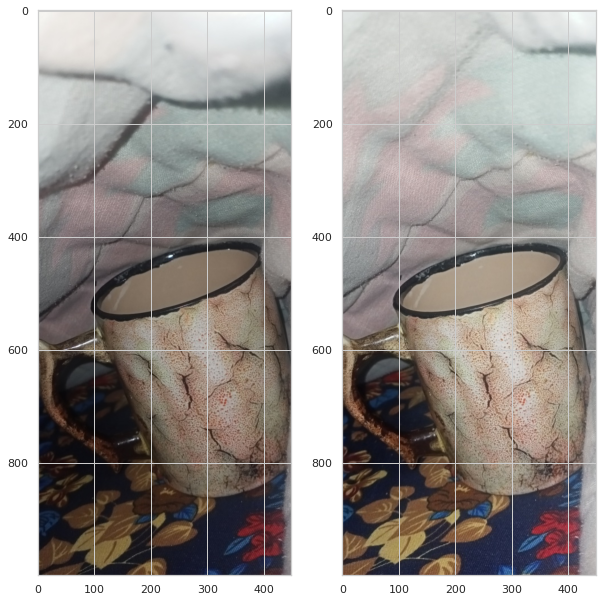

Kitchenware ID: 6049 / 6798
Label: plate / nan


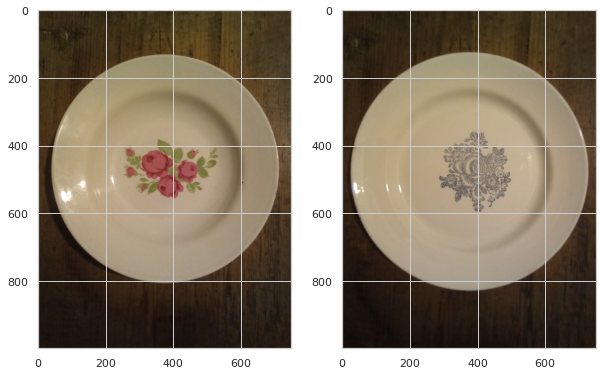

Kitchenware ID: 6130 / 6567
Label: nan / fork


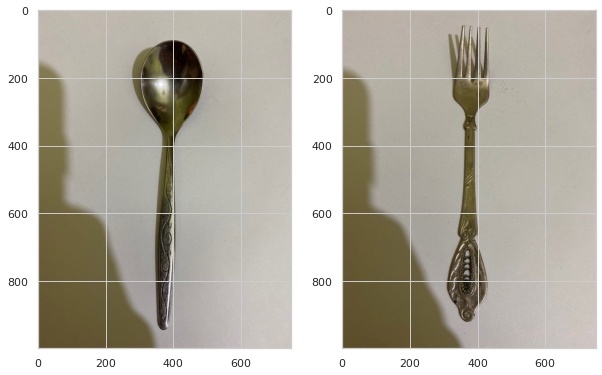

Kitchenware ID: 6373 / 6835
Label: fork / spoon


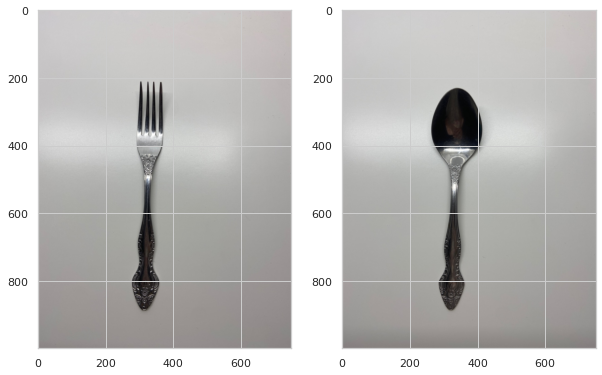

Kitchenware ID: 6833 / 8532
Label: cup / glass


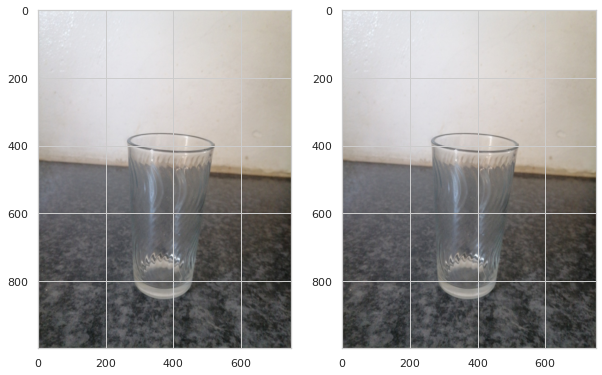

Kitchenware ID: 7063 / 7196
Label: spoon / fork


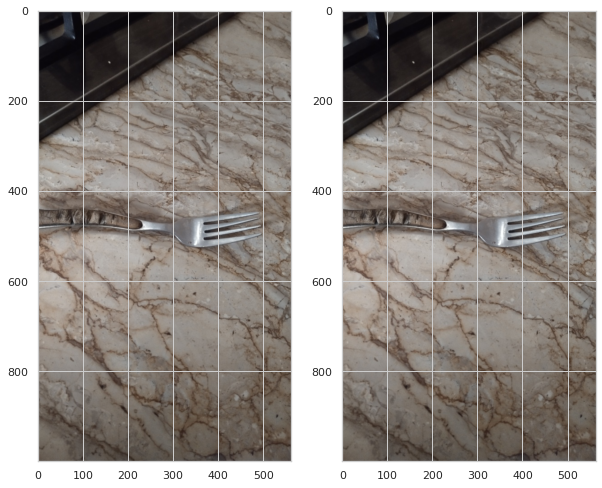

Kitchenware ID: 7162 / 8468
Label: fork / spoon


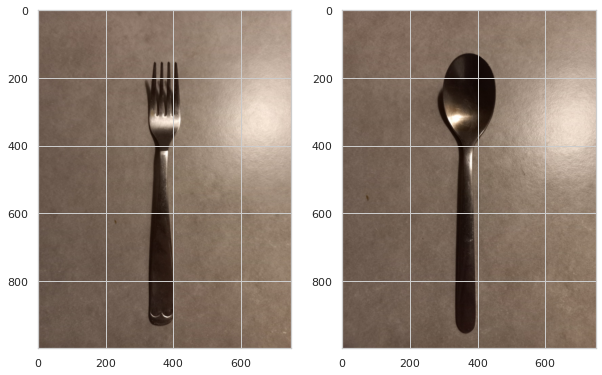

Kitchenware ID: 8256 / 8572
Label: nan / spoon


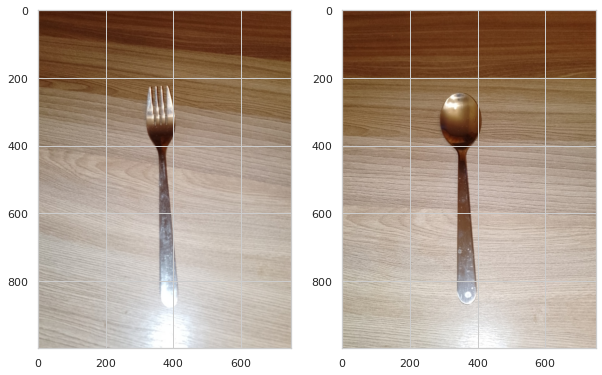

In [17]:
for kitid1, kitid2 in sorted(list(dups)):
    row1 = detail[kitid1]
    row2 = detail[kitid2]
    
#     test_na = [str(row1.label), str(row2.label)]
#     if 'nan' not in test_na:
#         if str(row1.label) != str(row2.label):
#             show(row1, row2)

    if str(row1.label) != str(row2.label):
        show(row1, row2)

### Conclusion
- There are some duplicated image in train data
- The hash alogirthm aren't perfect, because there are some image that treated as duplicated images, most of them because the background is the same
- There are some duplicated image inside train data that are inside test data

# Data

In [13]:
train_df, val_df = train_test_split(full_train, test_size=0.20, random_state=42)
train_df = train_df.reset_index(drop=True)
val_df = val_df.reset_index(drop=True)

In [14]:
train_gen = ImageDataGenerator(preprocessing_function=preprocess_input)
val_gen = ImageDataGenerator(preprocessing_function=preprocess_input)

In [15]:
train_df.head()

,Id,label,image,fixed_Id
0,8242,spoon,/kaggle/input/kitchenware-classification/image...,8242
1,181,knife,/kaggle/input/kitchenware-classification/image...,0181
2,4897,spoon,/kaggle/input/kitchenware-classification/image...,4897
3,7430,spoon,/kaggle/input/kitchenware-classification/image...,7430
4,4286,glass,/kaggle/input/kitchenware-classification/image...,4286


In [16]:
val_df.head()

,Id,label,image,fixed_Id
0,4016,plate,/kaggle/input/kitchenware-classification/image...,4016
1,4991,knife,/kaggle/input/kitchenware-classification/image...,4991
2,1458,spoon,/kaggle/input/kitchenware-classification/image...,1458
3,9066,spoon,/kaggle/input/kitchenware-classification/image...,9066
4,5767,cup,/kaggle/input/kitchenware-classification/image...,5767


# Data Loaders

In [14]:
train_ds = train_gen.flow_from_dataframe(
    train_df, 
    directory="/kaggle/input/kitchenware-classification/images",
    x_col='image',
    y_col='label',
    target_size=target_size,
    class_mode='categorical',
    batch_size=batch_size
)

Found 4447 validated image filenames belonging to 6 classes.


In [15]:
val_ds = val_gen.flow_from_dataframe(
    val_df, 
    directory="/kaggle/input/kitchenware-classification/images",
    x_col='image',
    y_col='label',
    target_size=target_size,
    class_mode='categorical',
    batch_size=batch_size
)

Found 1112 validated image filenames belonging to 6 classes.


In [16]:
train_ds.class_indices

{'cup': 0, 'fork': 1, 'glass': 2, 'knife': 3, 'plate': 4, 'spoon': 5}

In [17]:
val_ds.class_indices

{'cup': 0, 'fork': 1, 'glass': 2, 'knife': 3, 'plate': 4, 'spoon': 5}

# Base Model

In [20]:
base_model = Xception(
    weights='imagenet',
    include_top=False,
    input_shape=input_shape
)
base_model.trainable = False # Will not change the convolution layers

inputs = keras.Input(shape=input_shape)

base = base_model(inputs, training=False)
vectors = keras.layers.GlobalAveragePooling2D()(base) # To make a feature vector
outputs = keras.layers.Dense(6)(vectors) # To make a prediction 

model = keras.Model(inputs, outputs)

2023-01-18 00:51:57.284187: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-18 00:51:57.285329: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-18 00:51:57.286026: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-18 00:51:57.286853: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compil

83697664/83683744 [==============================] - 3s 0us/step


In [21]:
learning_rate = 0.01

# to compute and adjust the weights, to do that optimizer will optimize the loss function to get the lowest number
optimizer = keras.optimizers.Adam(learning_rate=learning_rate)

loss = keras.losses.CategoricalCrossentropy(from_logits=True)
model.compile(optimizer=optimizer, loss=loss, metrics=['accuracy'])

In [22]:
history = model.fit(
    train_ds,
    epochs=10,
    validation_data=val_ds
)

2023-01-18 00:52:14.709397: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


Epoch 1/10


2023-01-18 00:52:19.409982: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


139/139 [==============================] - 111s 731ms/step - loss: 0.6615 - accuracy: 0.8399 - val_loss: 0.5938 - val_accuracy: 0.8660
Epoch 2/10
139/139 [==============================] - 70s 503ms/step - loss: 0.3920 - accuracy: 0.9017 - val_loss: 0.8989 - val_accuracy: 0.8507
Epoch 3/10
139/139 [==============================] - 69s 499ms/step - loss: 0.3835 - accuracy: 0.9184 - val_loss: 0.7926 - val_accuracy: 0.8624
Epoch 4/10
139/139 [==============================] - 69s 500ms/step - loss: 0.2301 - accuracy: 0.9406 - val_loss: 0.7273 - val_accuracy: 0.8768
Epoch 5/10
139/139 [==============================] - 70s 504ms/step - loss: 0.1832 - accuracy: 0.9494 - val_loss: 0.8939 - val_accuracy: 0.8669
Epoch 6/10
139/139 [==============================] - 69s 498ms/step - loss: 0.1210 - accuracy: 0.9656 - val_loss: 0.9189 - val_accuracy: 0.8570
Epoch 7/10
139/139 [==============================] - 69s 498ms/step - loss: 0.0880 - accuracy: 0.9728 - val_loss: 0.9321 - val_accuracy: 0.

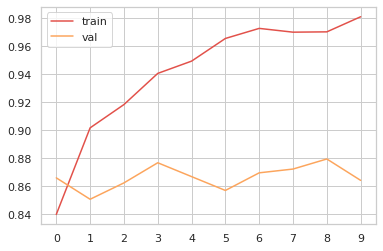

In [23]:
plt.plot(history.history['accuracy'], label='train')
plt.plot(history.history['val_accuracy'], label='val')
plt.xticks(np.arange(10))
plt.legend()

## Conclusion
- After the 1st epoch the accuracy between train and val become larger
- It is pointless to add more epoch

## Adjusting the Learning Rate

In [18]:
def make_model(learning_rate=0.01):
    base_model = Xception(
    weights='imagenet',
    include_top=False,
    input_shape=input_shape
    )

    base_model.trainable = False # Don't change the convolution layers

    ####################################################################### CREATE ARCHITECTURE
    inputs = keras.Input(shape=input_shape)

    base = base_model(inputs, training=False)

    pooling = keras.layers.GlobalAveragePooling2D() # To make a feature vector
    vectors = pooling(base)

    outputs = keras.layers.Dense(6)(vectors) # To make a prediction 

    model = keras.Model(inputs, outputs)
    ####################################################################### END OF ARCHITIECTURE
    
    # To know the best weights we need to use loss function
    loss = keras.losses.CategoricalCrossentropy(from_logits=True) 

    # to compute and adjust the weights, to do that optimizer will optimize the loss function to get the lowest number
    optimizer = keras.optimizers.Adam(learning_rate=learning_rate)

    model.compile(optimizer=optimizer, loss=loss, metrics=['accuracy'])

    return model

In [19]:
scores = {}
for lr in [0.0001, 0.001, 0.01, 0.1]:

    model = make_model(learning_rate=lr)
    history = model.fit(train_ds, epochs=10, validation_data=val_ds)
    scores[lr] = history.history

    print()
    print()

2023-01-18 12:05:54.785055: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-18 12:05:54.786187: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-18 12:05:54.786937: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-18 12:05:54.788473: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compil

83697664/83683744 [==============================] - 0s 0us/step


2023-01-18 12:06:02.551463: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


Epoch 1/10


2023-01-18 12:06:06.386443: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


139/139 [==============================] - 119s 791ms/step - loss: 1.1459 - accuracy: 0.6089 - val_loss: 0.7524 - val_accuracy: 0.7797
Epoch 2/10
139/139 [==============================] - 69s 498ms/step - loss: 0.6176 - accuracy: 0.8226 - val_loss: 0.5399 - val_accuracy: 0.8345
Epoch 3/10
139/139 [==============================] - 69s 494ms/step - loss: 0.4800 - accuracy: 0.8556 - val_loss: 0.4580 - val_accuracy: 0.8570
Epoch 4/10
139/139 [==============================] - 69s 496ms/step - loss: 0.4152 - accuracy: 0.8691 - val_loss: 0.4150 - val_accuracy: 0.8606
Epoch 5/10
139/139 [==============================] - 69s 496ms/step - loss: 0.3757 - accuracy: 0.8801 - val_loss: 0.3872 - val_accuracy: 0.8678
Epoch 6/10
139/139 [==============================] - 68s 493ms/step - loss: 0.3472 - accuracy: 0.8894 - val_loss: 0.3712 - val_accuracy: 0.8714
Epoch 7/10
139/139 [==============================] - 69s 495ms/step - loss: 0.3264 - accuracy: 0.8961 - val_loss: 0.3565 - val_accuracy: 0.

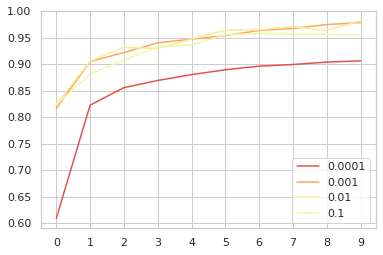

In [20]:
for lr, hist in scores.items():
    plt.plot(hist['accuracy'], label=lr)

plt.xticks(np.arange(10))
plt.legend()

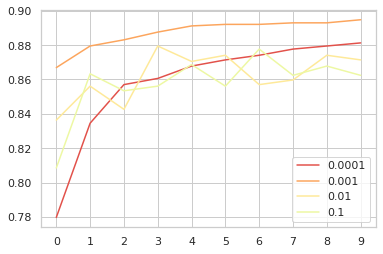

In [21]:
for lr, hist in scores.items():
    plt.plot(hist['val_accuracy'], label=lr)

plt.xticks(np.arange(10))
plt.legend()

## Conclusion
- Learning rate 0.001 & 0.0001 are the most stable one
- Will delete learning rate 0.01 & 0.1

In [23]:
del scores[0.1]
del scores[0.01]

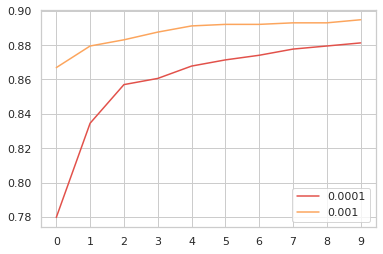

In [24]:
for lr, hist in scores.items():
    plt.plot(hist['val_accuracy'], label=lr)

plt.xticks(np.arange(10))
plt.legend()

In [25]:
learning_rate = 0.001 # The Best learning rate

# CheckPoint

In [20]:
checkpoint = keras.callbacks.ModelCheckpoint('xception_v1_{epoch:02d}_{val_accuracy:.3f}.h5',
                                             save_best_only=True, monitor='val_accuracy')

# Training a Larger Model

In [29]:
def make_model(learning_rate=0.01, size_inner=100):
    base_model = Xception(
    weights='imagenet',
    include_top=False,
    input_shape=input_shape
    )

    base_model.trainable = False # Don't change the convolution layers

    ####################################################################### CREATE ARCHITECTURE
    inputs = keras.Input(shape=input_shape)

    base = base_model(inputs, training=False)

    pooling = keras.layers.GlobalAveragePooling2D() # To make a feature vector
    vectors = pooling(base)

    inner = keras.layers.Dense(size_inner, activation='relu')(vectors)
    outputs = keras.layers.Dense(6)(inner) # To make a prediction 

    model = keras.Model(inputs, outputs)
    ####################################################################### END OF ARCHITIECTURE
    
    # To know the best weights we need to use loss function
    loss = keras.losses.CategoricalCrossentropy(from_logits=True) 

    # to compute and adjust the weights, to do that optimizer will optimize the loss function to get the lowest number
    optimizer = keras.optimizers.Adam(learning_rate=learning_rate)

    model.compile(optimizer=optimizer, loss=loss, metrics=['accuracy'])

    return model

In [30]:
scores = {}
learning_rate = 0.001

for size in [10, 100, 500]:
    print(size)

    model = make_model(learning_rate=learning_rate,size_inner=size)
    history = model.fit(train_ds, epochs=10, validation_data=val_ds, callbacks=[checkpoint])
    scores[size] = history.history

    print()
    print()

10
Epoch 1/10
139/139 [==============================] - 74s 515ms/step - loss: 0.9031 - accuracy: 0.6449 - val_loss: 0.4548 - val_accuracy: 0.8462
Epoch 2/10
139/139 [==============================] - 71s 511ms/step - loss: 0.3545 - accuracy: 0.8885 - val_loss: 0.3500 - val_accuracy: 0.8777
Epoch 3/10
139/139 [==============================] - 70s 502ms/step - loss: 0.2570 - accuracy: 0.9157 - val_loss: 0.3226 - val_accuracy: 0.8840
Epoch 4/10
139/139 [==============================] - 70s 506ms/step - loss: 0.2124 - accuracy: 0.9312 - val_loss: 0.3146 - val_accuracy: 0.8876
Epoch 5/10
139/139 [==============================] - 70s 504ms/step - loss: 0.1799 - accuracy: 0.9418 - val_loss: 0.3173 - val_accuracy: 0.8912
Epoch 6/10
139/139 [==============================] - 69s 495ms/step - loss: 0.1511 - accuracy: 0.9499 - val_loss: 0.3211 - val_accuracy: 0.8885
Epoch 7/10
139/139 [==============================] - 68s 492ms/step - loss: 0.1311 - accuracy: 0.9593 - val_loss: 0.3191 - val

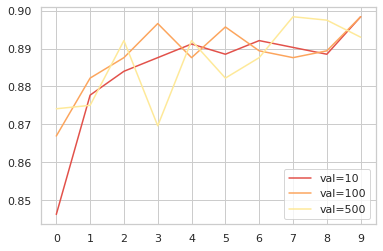

In [31]:
for size, hist in scores.items():
    plt.plot(hist['val_accuracy'], label=('val=%s' % size))

plt.xticks(np.arange(10))
plt.legend()

In [32]:
size = 10 # The best inner size, more stable than the others

# Regularization and Dropout

In [33]:
def make_model(learning_rate=0.01, size_inner=100, droprate=0.5):
    base_model = Xception(
    weights='imagenet',
    include_top=False,
    input_shape=input_shape
    )

    base_model.trainable = False # Don't change the convolution layers

    ####################################################################### CREATE ARCHITECTURE
    inputs = keras.Input(shape=input_shape)

    base = base_model(inputs, training=False)

    pooling = keras.layers.GlobalAveragePooling2D() # To make a feature vector
    vectors = pooling(base)

    inner = keras.layers.Dense(size_inner, activation='relu')(vectors)
    drop = keras.layers.Dropout(droprate)(inner)

    outputs = keras.layers.Dense(6)(drop) # To make a prediction 

    model = keras.Model(inputs, outputs)
    ####################################################################### END OF ARCHITIECTURE
    
    # To know the best weights we need to use loss function
    loss = keras.losses.CategoricalCrossentropy(from_logits=True) 

    # to compute and adjust the weights, to do that optimizer will optimize the loss function to get the lowest number
    optimizer = keras.optimizers.Adam(learning_rate=learning_rate)

    model.compile(optimizer=optimizer, loss=loss, metrics=['accuracy'])

    return model

In [34]:
scores = {}
learning_rate=0.001
size = 10

for droprate in [0, 0.5, 0.8]:
    print(size)

    model = make_model(learning_rate=learning_rate,size_inner=size,
        droprate=droprate)
    history = model.fit(train_ds, epochs=10, validation_data=val_ds, callbacks=[checkpoint])
    scores[droprate] = history.history

    print()
    print()

10
Epoch 1/10
139/139 [==============================] - 73s 505ms/step - loss: 0.6411 - accuracy: 0.7763 - val_loss: 0.3688 - val_accuracy: 0.8687
Epoch 2/10
139/139 [==============================] - 69s 494ms/step - loss: 0.3069 - accuracy: 0.8999 - val_loss: 0.3238 - val_accuracy: 0.8858
Epoch 3/10
139/139 [==============================] - 69s 500ms/step - loss: 0.2385 - accuracy: 0.9181 - val_loss: 0.3088 - val_accuracy: 0.8885
Epoch 4/10
139/139 [==============================] - 69s 500ms/step - loss: 0.1971 - accuracy: 0.9361 - val_loss: 0.3105 - val_accuracy: 0.8912
Epoch 5/10
139/139 [==============================] - 69s 495ms/step - loss: 0.1689 - accuracy: 0.9449 - val_loss: 0.3136 - val_accuracy: 0.8885
Epoch 6/10
139/139 [==============================] - 68s 492ms/step - loss: 0.1452 - accuracy: 0.9541 - val_loss: 0.3207 - val_accuracy: 0.8939
Epoch 7/10
139/139 [==============================] - 68s 490ms/step - loss: 0.1286 - accuracy: 0.9570 - val_loss: 0.3340 - val

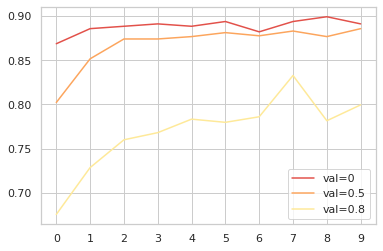

In [36]:
for droprate, hist in scores.items():
    plt.plot(hist['val_accuracy'], label=('val=%s' % droprate))

plt.xticks(np.arange(10))
plt.legend()

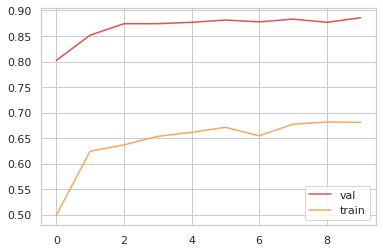

In [37]:
hist = scores[0.50]
plt.plot(hist['val_accuracy'], label='val')
plt.plot(hist['accuracy'], label='train')
plt.legend()

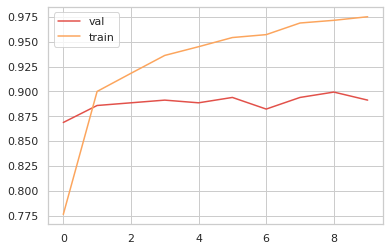

In [38]:
hist = scores[0.0]
plt.plot(hist['val_accuracy'], label='val')
plt.plot(hist['accuracy'], label='train')
plt.legend()

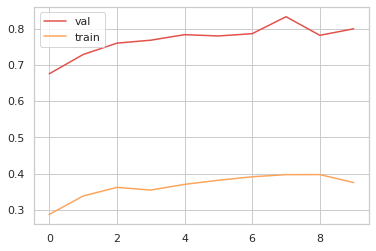

In [39]:
hist = scores[0.80]
plt.plot(hist['val_accuracy'], label='val')
plt.plot(hist['accuracy'], label='train')
plt.legend()

In [ ]:
droprate = 0 # The best droprate

# Data Augmentation
From the EDA we look the images are not fixed in the same direction, some are flips, some are zoom, etc. So augment the image will help the model to predict more accurate.

So we will do:
- width shift 
- height shift
- shear
- zoom
- horizontal flip
- vertical flip

In [17]:
train_gen = ImageDataGenerator(preprocessing_function=preprocess_input, width_shift_range=5, height_shift_range=10, 
                                  shear_range=10, zoom_range=0.1, horizontal_flip=True, vertical_flip=True)

train_ds = train_gen.flow_from_dataframe(
    train_df,
    x_col='image',
    y_col='label',
    target_size=target_size,
    batch_size=batch_size,
)

val_gen = ImageDataGenerator(preprocessing_function=preprocess_input)

val_ds = val_gen.flow_from_dataframe(
    val_df,
    x_col='image',
    y_col='label',
    target_size=target_size,
    batch_size=batch_size,
)

Found 4447 validated image filenames belonging to 6 classes.
Found 1112 validated image filenames belonging to 6 classes.


In [18]:
def make_model(learning_rate=0.01, size_inner=100, droprate=0.5):
    base_model = Xception(
    weights='imagenet',
    include_top=False,
    input_shape=input_shape
    )

    base_model.trainable = False # Don't change the convolution layers

    ####################################################################### CREATE ARCHITECTURE
    inputs = keras.Input(shape=input_shape)

    base = base_model(inputs, training=False)

    pooling = keras.layers.GlobalAveragePooling2D() # To make a feature vector
    vectors = pooling(base)

    inner = keras.layers.Dense(size_inner, activation='relu')(vectors)
    drop = keras.layers.Dropout(droprate)(inner)

    outputs = keras.layers.Dense(6)(drop) # To make a prediction 

    model = keras.Model(inputs, outputs)
    ####################################################################### END OF ARCHITIECTURE
    
    # To know the best weights we need to use loss function
    loss = keras.losses.CategoricalCrossentropy(from_logits=True) 

    # to compute and adjust the weights, to do that optimizer will optimize the loss function to get the lowest number
    optimizer = keras.optimizers.Adam(learning_rate=learning_rate)

    model.compile(optimizer=optimizer, loss=loss, metrics=['accuracy'])

    return model

In [21]:
learning_rate = 0.001
size = 10
droprate = 0

model = make_model(
    learning_rate=learning_rate,
    size_inner=size,
    droprate=droprate
)

In [22]:
history = model.fit(train_ds, epochs=20, validation_data=val_ds, callbacks=[checkpoint])

2023-01-19 00:26:54.910901: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


Epoch 1/20


2023-01-19 00:26:59.267237: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


139/139 [==============================] - 138s 926ms/step - loss: 0.9401 - accuracy: 0.6535 - val_loss: 0.4034 - val_accuracy: 0.8597
Epoch 2/20
139/139 [==============================] - 89s 642ms/step - loss: 0.4378 - accuracy: 0.8435 - val_loss: 0.3535 - val_accuracy: 0.8714
Epoch 3/20
139/139 [==============================] - 91s 653ms/step - loss: 0.3877 - accuracy: 0.8628 - val_loss: 0.3240 - val_accuracy: 0.8903
Epoch 4/20
139/139 [==============================] - 88s 636ms/step - loss: 0.3500 - accuracy: 0.8700 - val_loss: 0.3297 - val_accuracy: 0.8831
Epoch 5/20
139/139 [==============================] - 89s 638ms/step - loss: 0.3149 - accuracy: 0.8876 - val_loss: 0.3101 - val_accuracy: 0.8930
Epoch 6/20
139/139 [==============================] - 89s 640ms/step - loss: 0.3077 - accuracy: 0.8921 - val_loss: 0.3206 - val_accuracy: 0.8849
Epoch 7/20
139/139 [==============================] - 88s 636ms/step - loss: 0.2907 - accuracy: 0.8914 - val_loss: 0.3108 - val_accuracy: 0.

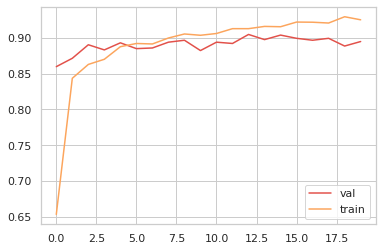

In [23]:
hist = history.history
plt.plot(hist['val_accuracy'], label='val')
plt.plot(hist['accuracy'], label='train')

plt.legend() 

## Conclusion
- After epoch 4, the accuracy between train and val are become larger
- With Augmentation the accuracy slightly increasing

# Training with Higher Resolution

In [17]:
input_shape = (256,256,3)
target_size = (256,256)
batch_size = 32

In [18]:
def make_model(learning_rate=0.01, size_inner=100, droprate=0.5):
    base_model = Xception(
    weights='imagenet',
    include_top=False,
    input_shape=input_shape
    )

    base_model.trainable = False # Don't change the convolution layers

    ####################################################################### CREATE ARCHITECTURE
    inputs = keras.Input(shape=input_shape)

    base = base_model(inputs, training=False)

    pooling = keras.layers.GlobalAveragePooling2D() # To make a feature vector
    vectors = pooling(base)

    inner = keras.layers.Dense(size_inner, activation='relu')(vectors)
    drop = keras.layers.Dropout(droprate)(inner)

    outputs = keras.layers.Dense(6)(drop) # To make a prediction 

    model = keras.Model(inputs, outputs)
    ####################################################################### END OF ARCHITIECTURE
    
    # To know the best weights we need to use loss function
    loss = keras.losses.CategoricalCrossentropy(from_logits=True) 

    # to compute and adjust the weights, to do that optimizer will optimize the loss function to get the lowest number
    optimizer = keras.optimizers.Adam(learning_rate=learning_rate)

    model.compile(optimizer=optimizer, loss=loss, metrics=['accuracy'])

    return model

In [19]:
train_gen = ImageDataGenerator(preprocessing_function=preprocess_input, width_shift_range=5, height_shift_range=10, 
                                  shear_range=10, zoom_range=0.1, horizontal_flip=True, vertical_flip=True)

train_ds = train_gen.flow_from_dataframe(
    train_df,
    x_col='image',
    y_col='label',
    target_size=target_size,
    batch_size=batch_size,
)

val_gen = ImageDataGenerator(preprocessing_function=preprocess_input)

val_ds = val_gen.flow_from_dataframe(
    val_df,
    x_col='image',
    y_col='label',
    target_size=target_size,
    batch_size=batch_size,
)

Found 4447 validated image filenames belonging to 6 classes.
Found 1112 validated image filenames belonging to 6 classes.


In [20]:
learning_rate = 0.001
size = 10
droprate = 0

model = make_model(
    learning_rate=learning_rate,
    size_inner=size,
    droprate=droprate
)

2023-01-19 23:57:32.018673: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-19 23:57:32.019766: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-19 23:57:32.020467: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-19 23:57:32.021313: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compil

83697664/83683744 [==============================] - 0s 0us/step


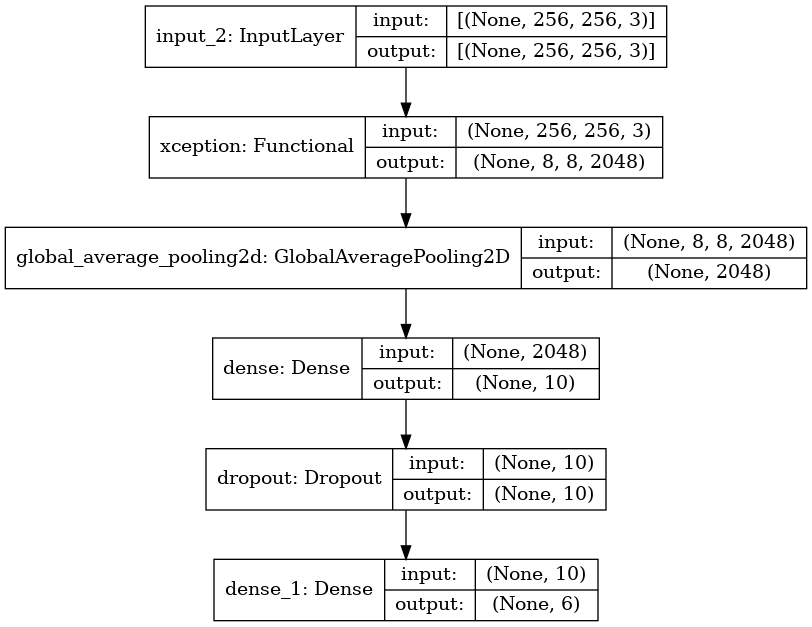

In [32]:
from tensorflow.keras.utils import plot_model
display(plot_model(model,
                   show_shapes=True,
                   show_layer_names=True))

In [23]:
checkpoint = keras.callbacks.ModelCheckpoint('xception_v1_{epoch:02d}_{val_accuracy:.3f}.h5',
                                             save_best_only=True, monitor='val_accuracy')

In [24]:
history = model.fit(train_ds, epochs=20, validation_data=val_ds, callbacks=[checkpoint])

2023-01-19 23:58:06.186181: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


Epoch 1/20


2023-01-19 23:58:10.419275: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


139/139 [==============================] - 195s 1s/step - loss: 0.9284 - accuracy: 0.6622 - val_loss: 0.5493 - val_accuracy: 0.8408
Epoch 2/20
139/139 [==============================] - 139s 1s/step - loss: 0.4851 - accuracy: 0.8475 - val_loss: 0.3424 - val_accuracy: 0.9110
Epoch 3/20
139/139 [==============================] - 136s 981ms/step - loss: 0.2944 - accuracy: 0.9152 - val_loss: 0.1957 - val_accuracy: 0.9353
Epoch 4/20
139/139 [==============================] - 130s 933ms/step - loss: 0.2149 - accuracy: 0.9296 - val_loss: 0.1865 - val_accuracy: 0.9388
Epoch 5/20
139/139 [==============================] - 132s 948ms/step - loss: 0.1945 - accuracy: 0.9337 - val_loss: 0.1666 - val_accuracy: 0.9451
Epoch 6/20
139/139 [==============================] - 131s 944ms/step - loss: 0.1692 - accuracy: 0.9449 - val_loss: 0.1682 - val_accuracy: 0.9344
Epoch 7/20
139/139 [==============================] - 131s 941ms/step - loss: 0.1700 - accuracy: 0.9400 - val_loss: 0.1604 - val_accuracy: 0.

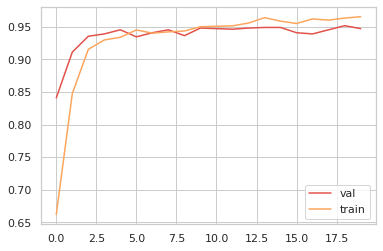

In [27]:
hist = history.history
plt.plot(hist['val_accuracy'], label='val')
plt.plot(hist['accuracy'], label='train')

plt.legend()

## Conclusion
- Increasing the image resolution gets higher accuracy
- After 4 epoch, the accuracy became flat, it is pointless to use higher epoch

# Inference

In [26]:
test.head()

,Id,image,fixed_Id
0,678,/kaggle/input/kitchenware-classification/image...,0678
1,3962,/kaggle/input/kitchenware-classification/image...,3962
2,9271,/kaggle/input/kitchenware-classification/image...,9271
3,5133,/kaggle/input/kitchenware-classification/image...,5133
4,8842,/kaggle/input/kitchenware-classification/image...,8842


In [29]:
test_gen = ImageDataGenerator(preprocessing_function=preprocess_input)


test_ds = test_gen.flow_from_dataframe(
    test,
    x_col='image',
    class_mode='input',
    target_size=target_size,
    batch_size=batch_size,
    shuffle=False
)

Found 3808 validated image filenames.


In [33]:
model = keras.models.load_model('/kaggle/working/xception_v1_04_0.939.h5')

In [34]:
y_pred = model.predict(test_ds)

In [35]:
classes = np.array(list(train_ds.class_indices.keys()))
classes

array(['cup', 'fork', 'glass', 'knife', 'plate', 'spoon'], dtype='<U5')

In [36]:
predictions = classes[y_pred.argmax(axis=1)]

In [43]:
sample.tail()

,Id,label
3803,7626,spoon
3804,2052,cup
3805,8827,glass
3806,2299,knife
3807,2212,fork


In [44]:
test.tail()

,Id,image,fixed_Id
3803,7626,/kaggle/input/kitchenware-classification/image...,7626
3804,2052,/kaggle/input/kitchenware-classification/image...,2052
3805,8827,/kaggle/input/kitchenware-classification/image...,8827
3806,2299,/kaggle/input/kitchenware-classification/image...,2299
3807,2212,/kaggle/input/kitchenware-classification/image...,2212


In [45]:
sample['label'] = predictions

In [46]:
sample.tail()

,Id,label
3803,7626,plate
3804,2052,cup
3805,8827,spoon
3806,2299,fork
3807,2212,spoon


In [47]:
sample.to_csv('submission_v1.csv', index=False)